In [1]:
import pandas as pd
import numpy as np
data1 = pd.read_csv('C:/python/data_5area.csv')
data1.drop('Unnamed: 0',axis=1,inplace=True)
data1[['total','per_week_total','per_2weeks_total','per_30days_total']]=data1[['total','per_week_total','per_2weeks_total','per_30days_total']].astype('int64')
#data1[['events','area_type','year','month_dayth','festival']] = data1[['events','area_type','year','month_dayth','festival']].astype('category')
data1['temperature'] = data1['temperature'].astype('float64')

In [2]:
data1['year'] = data1['starttime'].apply( lambda x : x.split('-')[0])
data1['month_dayth'] = data1['starttime'].apply(lambda x : x.split('-')[1]+'-'+x.split('-')[2])
data1['month'] = data1['starttime'].apply(lambda x : x.split('-')[1]).astype('int64')
def festival_d(x):
    if x in [3,4,5]:
        return 'spring'
    elif x in [6,7,8]:
        return 'summer'
    elif x in [9,10,11]:
        return 'authum'
    else:
        return 'winter'

def weekend_judge(x):
    if (x==5) or (x==6):
        return 1
    else:
        return 0
data1['festival']=data1['month'].apply(lambda x :festival_d(x))
data1['isweekend']=data1['starttime'].apply(lambda x : weekend_judge(pd.to_datetime(x).weekday()))

In [3]:
data1.drop('month',axis=1,inplace=True)
data1.to_csv('C:/python/data_5_area.csv')

array([[<AxesSubplot:title={'center':'Unnamed: 0.1'}>,
        <AxesSubplot:title={'center':'total'}>,
        <AxesSubplot:title={'center':'area_type'}>],
       [<AxesSubplot:title={'center':'temperature'}>,
        <AxesSubplot:title={'center':'per_week_total'}>,
        <AxesSubplot:title={'center':'per_2weeks_total'}>],
       [<AxesSubplot:title={'center':'per_30days_total'}>,
        <AxesSubplot:title={'center':'isweekend'}>, <AxesSubplot:>]],
      dtype=object)

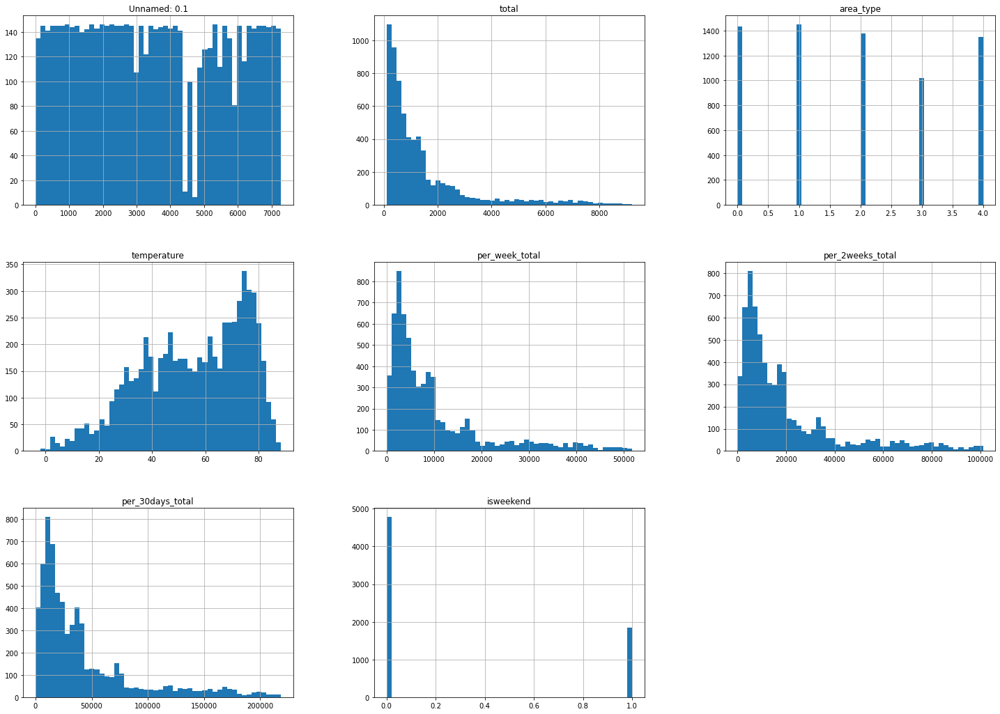

In [4]:
data1.loc[data1['total']>100].hist(bins=50,figsize=(25,18))

In [26]:
data1.describe()

,total,temperature,per_week_total,per_2weeks_total,per_30days_total
count,5824.000000,5824.000000,5824.00000,5824.000000,5824.000000
mean,731.625687,53.001901,5119.44763,10229.304087,21842.464457
std,640.210550,20.841858,4325.09436,8589.499319,18290.322183
min,1.000000,-15.000000,0.00000,0.000000,0.000000
25%,236.000000,37.282481,1803.75000,3681.750000,8072.250000
50%,534.000000,55.074530,3819.00000,7657.500000,16500.500000
75%,1099.000000,71.698427,7637.25000,15160.500000,33107.500000
max,3298.000000,88.131293,19163.00000,37095.000000,78834.000000


In [41]:
data1.loc[data1['total']>100].describe()

,total,temperature,per_week_total,per_2weeks_total,per_30days_total
count,5181.000000,5181.000000,5181.000000,5181.000000,5181.000000
mean,815.986682,55.856515,5681.486586,11343.968925,24201.945377
std,629.422539,19.208297,4257.036883,8453.463666,18003.330714
min,101.000000,-1.048077,0.000000,0.000000,0.000000
25%,327.000000,40.836747,2445.000000,4912.000000,10633.000000
50%,619.000000,58.593761,4353.000000,8679.000000,18398.000000
75%,1184.000000,72.885118,8312.000000,16716.000000,35441.000000
max,3298.000000,88.131293,19163.000000,37095.000000,78834.000000


In [1]:
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import r2_score
#data1 = pd.read_csv('C:/python/data_1.csv')
#data1.drop(['Unnamed: 0'],axis=1,inplace=True)
data1 = pd.read_csv('C:/python/data_5_area.csv')
data1.drop(['Unnamed: 0','Unnamed: 0.1'],axis=1,inplace=True)

data1[['total','per_week_total','per_2weeks_total','per_30days_total']]=data1[['total','per_week_total','per_2weeks_total','per_30days_total']].astype('int64')
data1[['events','area_type','year','month_dayth','festival','isweekend']] = data1[['events','area_type','year','month_dayth','festival','isweekend']].astype('category')
#data1['temperature'] = data1['temperature'].astype('float64')

#data=data1.loc[data1['total']>40]
data=data1.loc[(data1['total']>40)&(data1['total']<8000)]
#data= data.loc[ data1['area_type'].isin([0,1,2,4])]




X_train,X_test,y_train,y_test =train_test_split(data.drop(['total','starttime','year'],axis=1),data['total'],test_size=0.2)

evals_result={}

lgb_train = lgb.Dataset(X_train, y_train) # 将数据保存到LightGBM二进制文件将使加载更快
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)  # 创建验证数据

params = {
    #'max_depth': 6,
    
    'task': 'train',
    'boosting_type': 'gbdt',  # 设置提升类型
    'objective': 'regression', # 目标函数
    'metric': ('l2_root', 'l1'),  # 评估函数
    'num_leaves': 31,   # 叶子节点数
    'learning_rate': 0.001,  # 学习速率
    'feature_fraction': 0.7, # 建树的特征选择比例
    'bagging_fraction': 0.7, # 建树的样本采样比例
    'bagging_freq': 1,  # k 意味着每 k 次迭代执行bagging
    'verbose': 1, # <0 显示致命的, =0 显示错误 (警告), >0 显示信息
     'min_data_in_leaf':25,
    #'min_sum_hessian_in_leaf':1e-3,
    #'lambda_l1':0,
    #'lambda_l2':0,
    #'min_split_gain':0
}
print('Start training...')
# 训练 cv and train
gbm = lgb.train(params,lgb_train,num_boost_round=10000,valid_sets=lgb_eval,evals_result=evals_result) # 训练数据需要参数列表和数据集
print('Start predicting...')
# 预测数据集
y_pred = gbm.predict(X_test, num_iteration=gbm.best_iteration) #如果在训练期间启用了早期停止，可以通过best_iteration方式从最佳迭代中获得预测
# 评估模型
def mape_cal(observe,predict_,shape):

    mape_=(abs(observe-predict_)/observe).sum()*100/shape
    return mape_
mape=mape_cal(y_test,y_pred,y_pred.shape[0])
print('The rmse of prediction is:', mean_squared_error(y_test, y_pred) ** 0.5) # 计算真实值和预测值之间的均方根误差
print('The mae of prediction is:', mean_absolute_error(y_test, y_pred) )
print('The r2_score of prediction is:', r2_score(y_test, y_pred) )
print('The mape of prediction is: '+str(mape)+'%')

valid_0's rmse: 330.009	valid_0's l1: 177.674
[9627]	valid_0's rmse: 330.01	valid_0's l1: 177.673
[9628]	valid_0's rmse: 330.011	valid_0's l1: 177.673
[9629]	valid_0's rmse: 330.005	valid_0's l1: 177.67
[9630]	valid_0's rmse: 330.007	valid_0's l1: 177.671
[9631]	valid_0's rmse: 330.007	valid_0's l1: 177.67
[9632]	valid_0's rmse: 330.007	valid_0's l1: 177.671
[9633]	valid_0's rmse: 330.01	valid_0's l1: 177.672
[9634]	valid_0's rmse: 330.005	valid_0's l1: 177.671
[9635]	valid_0's rmse: 330.004	valid_0's l1: 177.671
[9636]	valid_0's rmse: 329.997	valid_0's l1: 177.664
[9637]	valid_0's rmse: 329.998	valid_0's l1: 177.662
[9638]	valid_0's rmse: 330.004	valid_0's l1: 177.664
[9639]	valid_0's rmse: 329.999	valid_0's l1: 177.663
[9640]	valid_0's rmse: 330.001	valid_0's l1: 177.663
[9641]	valid_0's rmse: 330.001	valid_0's l1: 177.662
[9642]	valid_0's rmse: 330.004	valid_0's l1: 177.662
[9643]	valid_0's rmse: 329.999	valid_0's l1: 177.659
[9644]	valid_0's rmse: 329.997	valid_0's l1: 177.66
[9645

In [11]:
data1.corr

,total,temperature,per_week_total,per_2weeks_total,per_30days_total
total,1.000000,0.376422,0.902936,0.900709,0.892461
temperature,0.376422,1.000000,0.384764,0.373748,0.353584
per_week_total,0.902936,0.384764,1.000000,0.994197,0.983843
per_2weeks_total,0.900709,0.373748,0.994197,1.000000,0.992911
per_30days_total,0.892461,0.353584,0.983843,0.992911,1.000000


In [16]:
data0 = data[['per_week_total','per_2weeks_total','per_30days_total']].values
scar = preprocessing.StandardScaler().fit(data0)
data0_trans = scar.transform(data0)
data[['per_week_total','per_2weeks_total','per_30days_total']] = data0_trans

<ipython-input-16-63eb5cc416f6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[['per_week_total','per_2weeks_total','per_30days_total']] = data0_trans
C:\Users\陈永希\AppData\Roaming\Python\Python38\site-packages\pandas\core\indexing.py:1736: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


In [12]:
data1.loc[data1['total']<40]

,total,starttime,area_type,events,temperature,per_week_total,per_2weeks_total,per_30days_total,year,month_dayth,festival,isweekend
0,35,2014-01-01,0.0,rain or snow,18.982857,0,0,0,2014,01-01,winter,0
1,16,2014-01-02,0.0,rain or snow,16.800000,0,0,0,2014,01-02,winter,0
2,1,2014-01-03,0.0,clear,-2.900000,0,0,0,2014,01-03,winter,0
4,9,2014-01-05,0.0,rain or snow,15.822222,0,0,0,2014,01-05,winter,1
5,1,2014-01-06,0.0,cloudy,-15.000000,0,0,0,2014,01-06,winter,0
...,...,...,...,...,...,...,...,...,...,...,...,...
5882,36,2014-03-03,4.0,cloudy,10.722222,416,884,1549,2014,03-03,spring,0
6216,22,2015-02-01,4.0,rain or snow,26.568182,1207,2819,4511,2015,02-01,winter,1
6217,36,2015-02-02,4.0,cloudy,9.772222,1140,2661,4312,2015,02-02,winter,0
6230,36,2015-02-15,4.0,rain or snow,10.169444,914,1391,4615,2015,02-15,winter,1


array([[<AxesSubplot:title={'center':'total'}>,
        <AxesSubplot:title={'center':'temperature'}>],
       [<AxesSubplot:title={'center':'per_week_total'}>,
        <AxesSubplot:title={'center':'per_2weeks_total'}>],
       [<AxesSubplot:title={'center':'per_30days_total'}>,
        <AxesSubplot:>]], dtype=object)

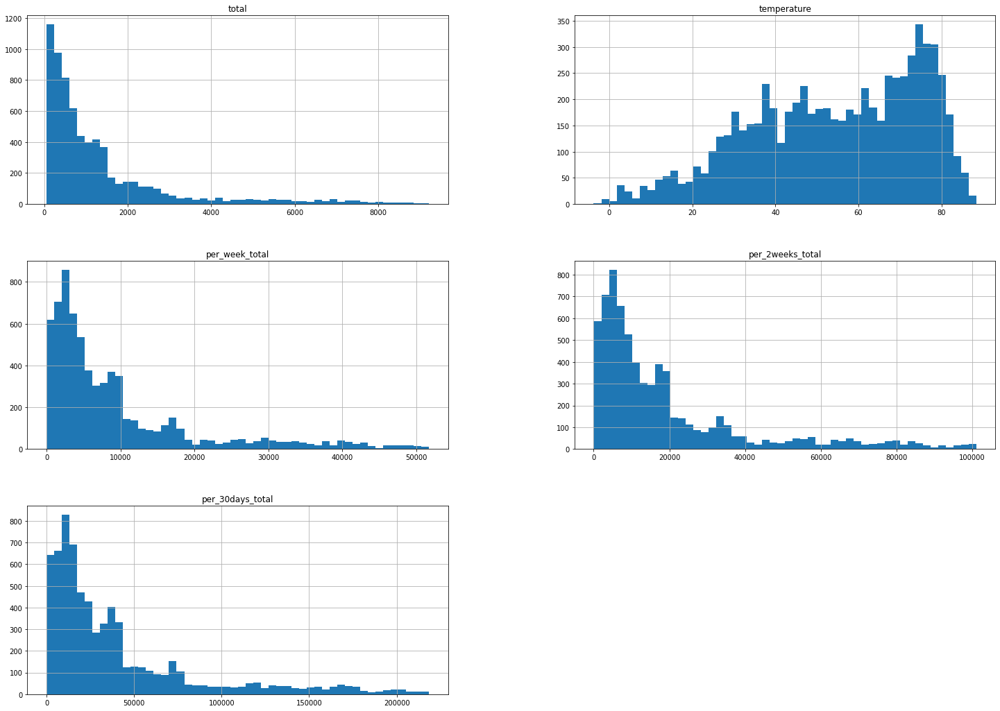

In [2]:
data.hist(bins=50,figsize=(25,18))

<AxesSubplot:title={'center':'Metric during training'}, xlabel='Iterations', ylabel='rmse'>

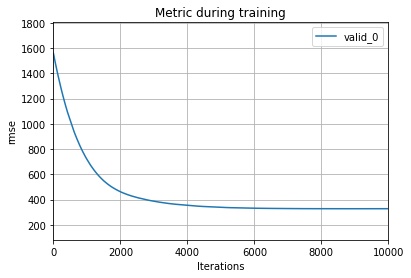

In [16]:
lgb.plot_metric(evals_result,metric='rmse')

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

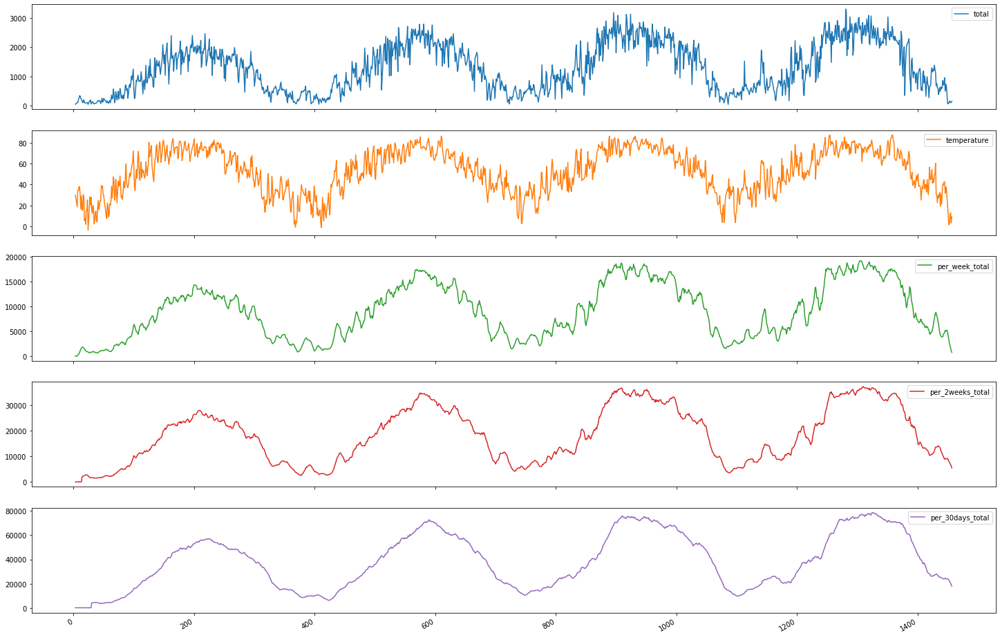

In [9]:
data.loc[data['area_type'].isin([0])].plot(subplots=True,figsize=(25,18))

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

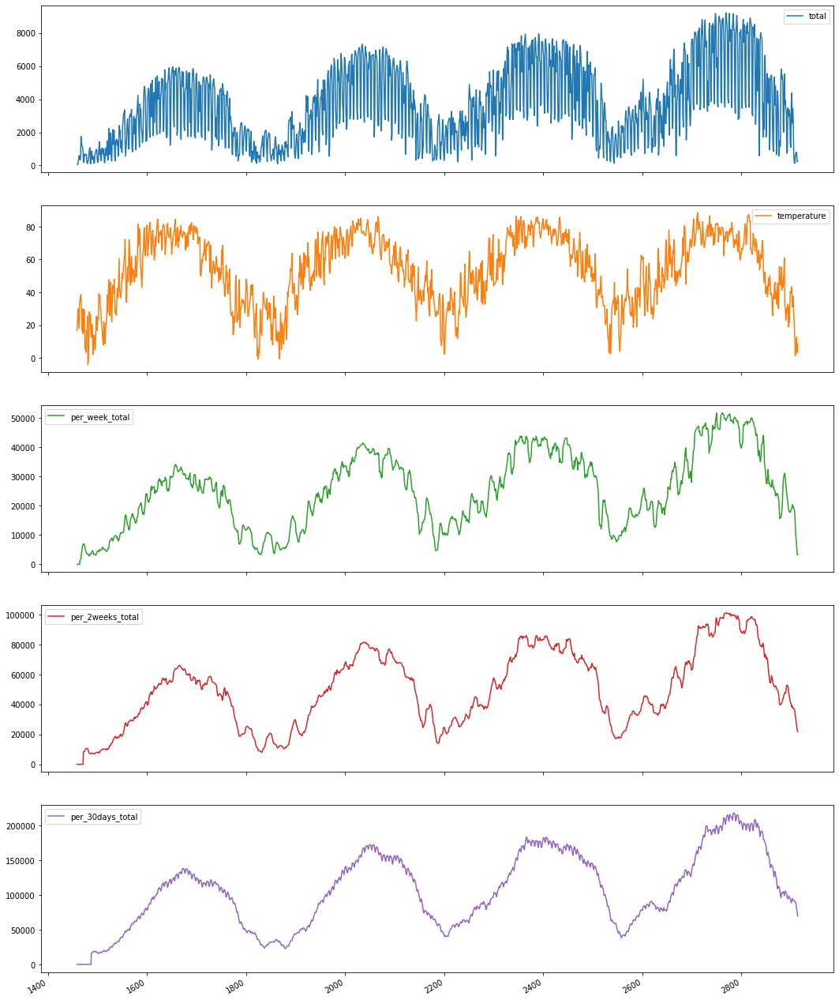

In [18]:
data.loc[data['area_type'].isin([1])].plot(subplots=True,figsize=(18,25))

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

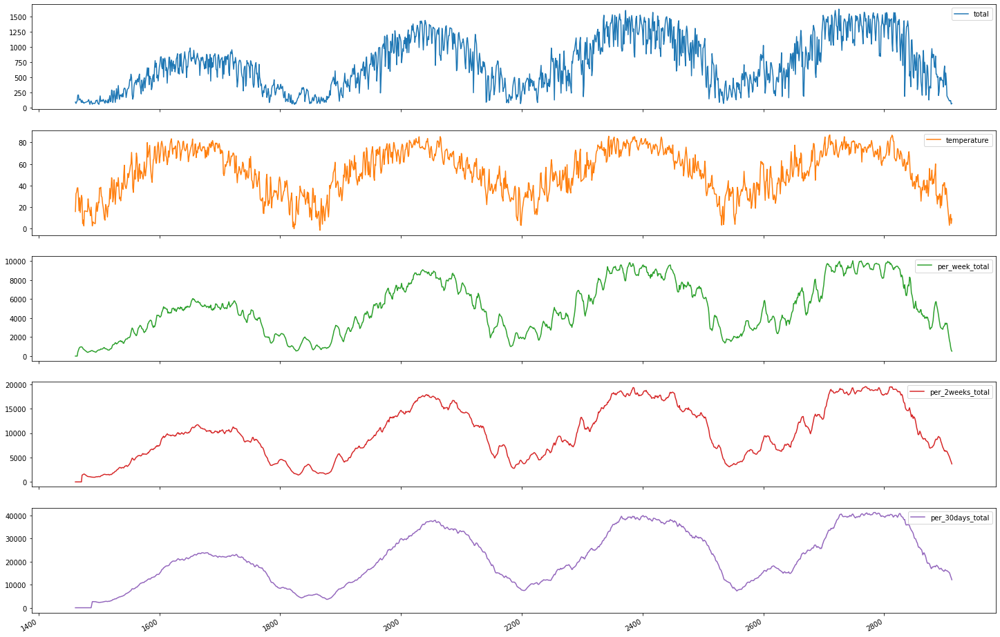

In [10]:
data.loc[data['area_type'].isin([2])].plot(subplots=True,figsize=(25,18))

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

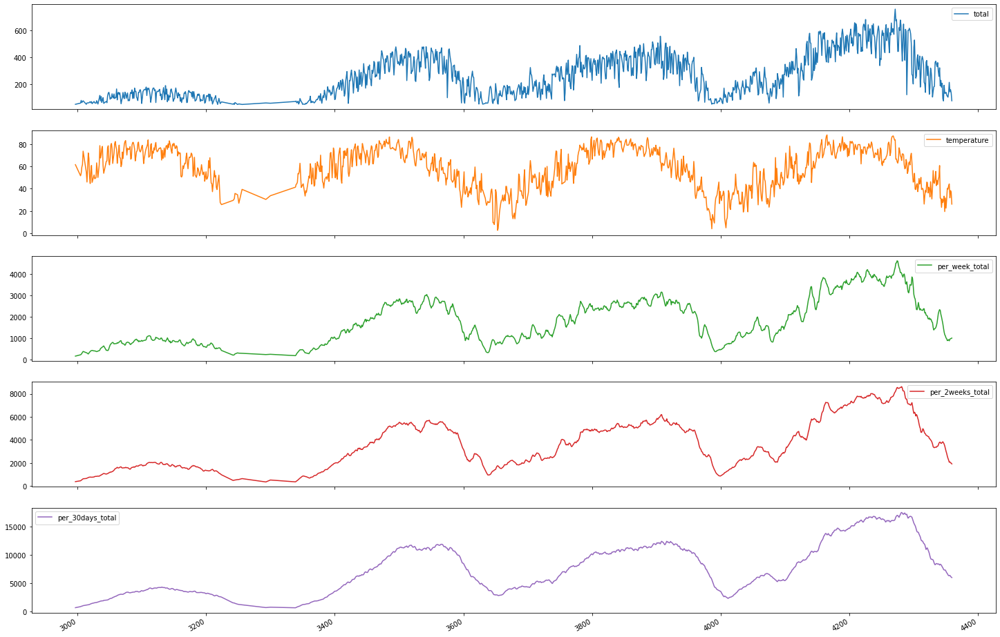

In [11]:
data.loc[data['area_type'].isin([3])].plot(subplots=True,figsize=(25,18))

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

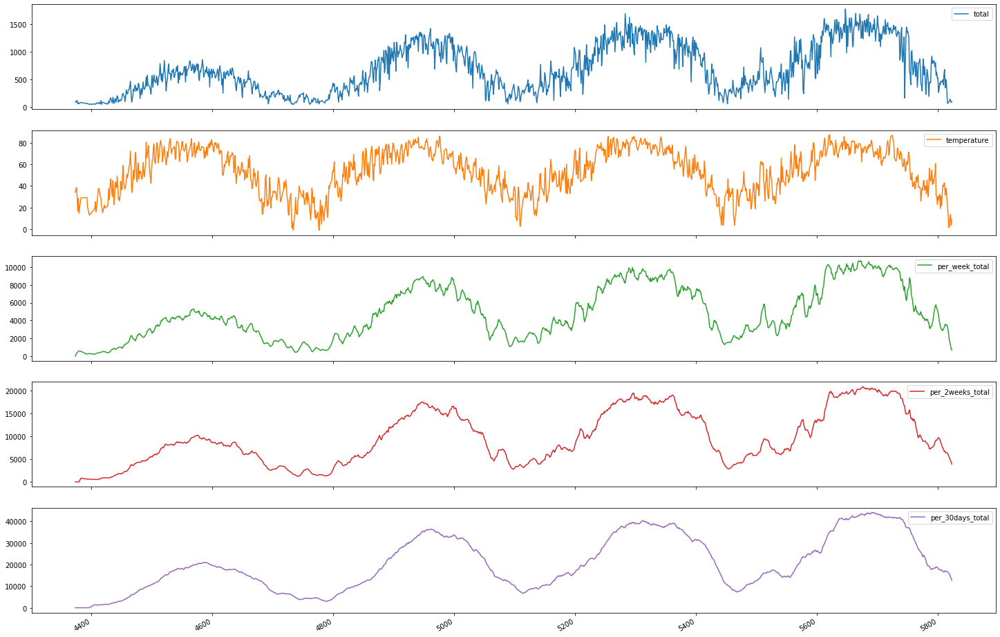

In [12]:
data.loc[data['area_type'].isin([4])].plot(subplots=True,figsize=(25,18))

In [16]:
for i in range(5):
    k=data.loc[data['area_type'].isin([i])]['total'].sum()
    print(k)

1891445
5234147
1043824
322398
995141


<AxesSubplot:>

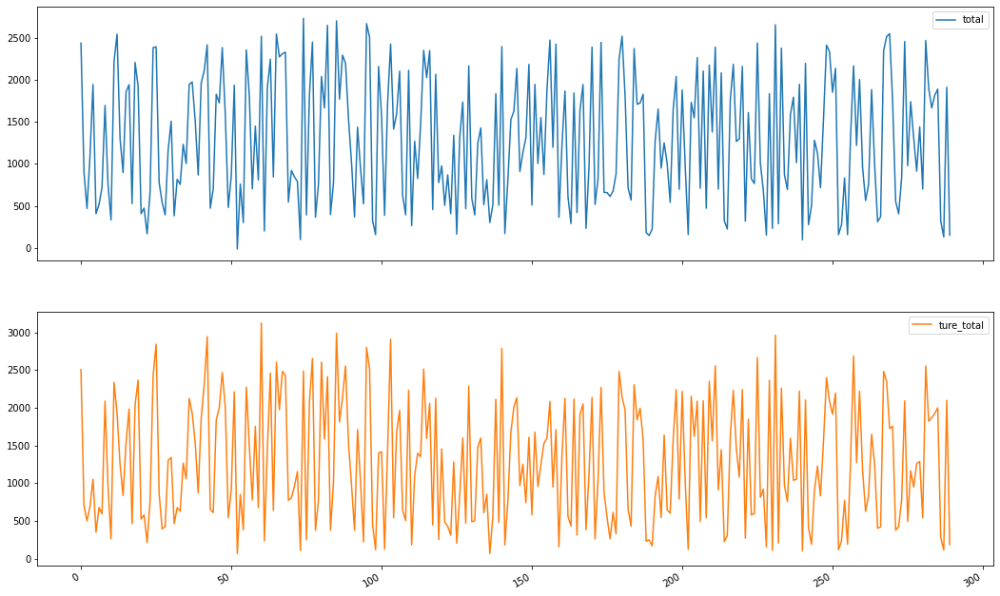

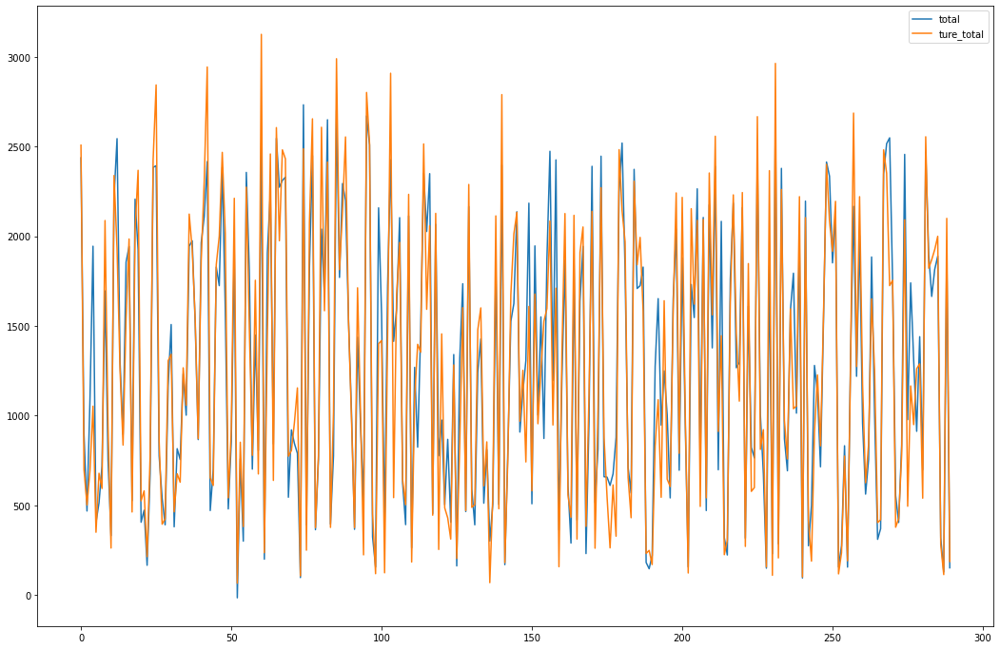

In [14]:
y=np.hstack((y_pred.reshape(290,1),y_test.values.reshape(290,1)))
df=pd.DataFrame(y,columns=['total','ture_total'])

df.plot(subplots=True,figsize=(18,12))
df.plot(figsize=(18,12))

<AxesSubplot:>

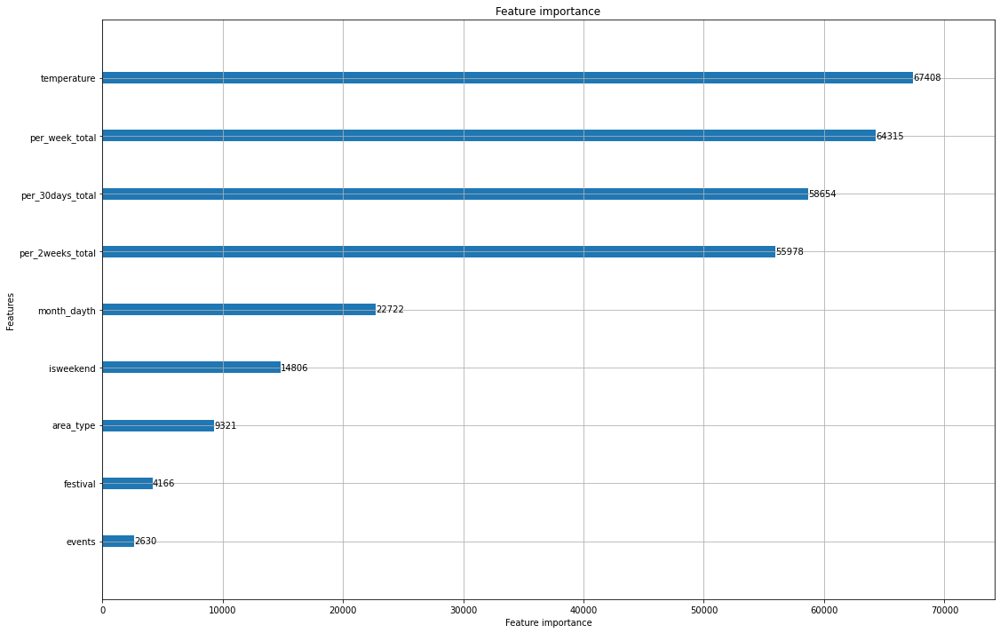

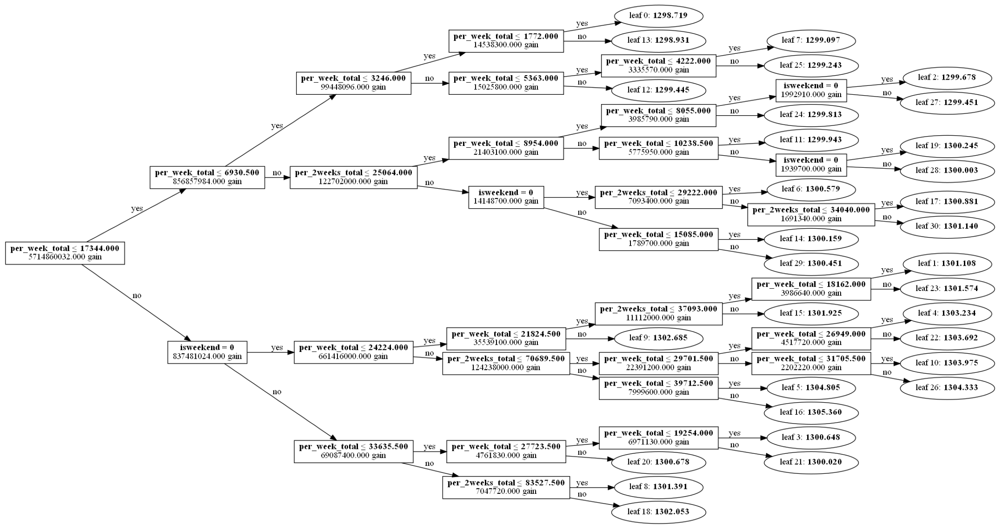

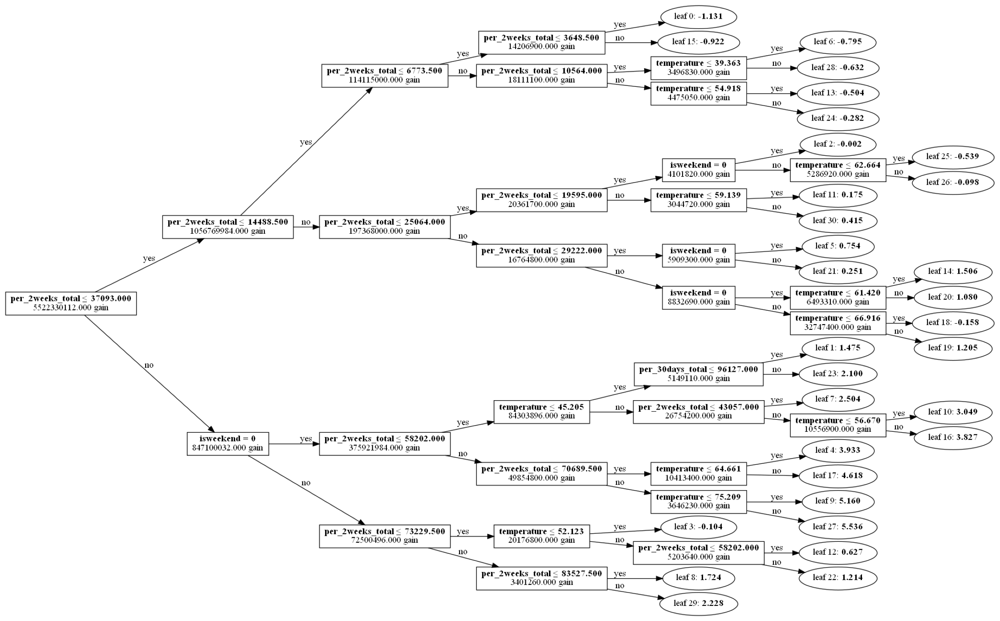

In [2]:
lgb.plot_importance(gbm,figsize=(18,12))
#lgb.plot_tree(gbm,figsize=(40,30))
lgb.plot_tree(gbm,tree_index=0,figsize=(40,30),show_info=['split_gain'])
lgb.plot_tree(gbm,tree_index=1,figsize=(40,30),show_info=['split_gain'])

In [42]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5824 entries, 0 to 5823
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   total             5824 non-null   int64   
 1   starttime         5824 non-null   object  
 2   area_type         5824 non-null   category
 3   events            5824 non-null   category
 4   temperature       5824 non-null   float64 
 5   per_week_total    5824 non-null   int64   
 6   per_2weeks_total  5824 non-null   int64   
 7   per_30days_total  5824 non-null   int64   
 8   year              5824 non-null   object  
 9   month_dayth       5824 non-null   object  
 10  festival          5824 non-null   object  
dtypes: category(2), float64(1), int64(4), object(4)
memory usage: 421.4+ KB


In [6]:
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import r2_score
#data1 = pd.read_csv('C:/python/data_1.csv')
#data1.drop(['Unnamed: 0'],axis=1,inplace=True)
data1 = pd.read_csv('C:/python/data_10areas_new.csv')
data1.drop(['Unnamed: 0'],axis=1,inplace=True)

data1[['total','per_week_total','per_2weeks_total','per_30days_total']]=\
    data1[['total','per_week_total','per_2weeks_total','per_30days_total']].astype('int64')

#data1['per_week_total_mean'] = data1['per_week_total'].apply(lambda x :x/7)
#data1['per_2weeks_total_mean'] = data1['per_2weeks_total'].apply(lambda x :x/14)
#data1['per_30days_total_mean'] = data1['per_30days_total'].apply(lambda x : x/30)

data1[['events','year','month_dayth','festival','dayth','area_type','month','isweekend']] =\
     data1[['events','year','month_dayth','festival','dayth','area_type','month','isweekend']].astype('category')
#data1['temperature'] = data1['temperature'].astype('float64')
#,'month','isweekend','area_type'

data1[['per_week_total','per_2weeks_total','per_30days_total']] = data1[['per_week_total','per_2weeks_total','per_30days_total']].apply(np.log)

#
#data=data1.loc[data1['total']>40]
#data1 = data1.loc[data1['area_type'].isin([1])]
#data= data.loc[ data1['area_type'].isin([0,1,2,3,4,6,8,9])]
#data1=data1.loc[(data1['total']>30)&(data1['total']<3500)]
data_test = data1.loc[(data1['year'].astype('int64').isin([2017]))]
data_train = data1.loc[(data1['year'].astype('int64').isin([2014,2015,2016]))]

#data_train=data_train.loc[(data_train['total']>20)]
#data_test = data1.loc[(data1['year'].astype('int64').isin([2017]))&(data1['month'].astype('int64')>6)]
#data_temp = data1.loc[(data1['year'].astype('int64').isin([2017]))&(data1['month'].astype('int64')<=6)]
#data_train = pd.concat([data_train,data_temp])


X_train,X_test,y_train,y_test =train_test_split(data_train.drop(['total','starttime','year','dayth',\
  ],axis=1),data_train['total'],test_size=0.2)

evals_result={}

lgb_train = lgb.Dataset(X_train, y_train) # 将数据保存到LightGBM二进制文件将使加载更快
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)  # 创建验证数据

params = {
    #'max_depth': 6,
    
    'task': 'train',
    'boosting_type': 'gbdt',  # 设置提升类型
    'objective': 'regression', # 目标函数
    'metric': ('l2_root', 'l1'),  # 评估函数
    'num_leaves': 31,   # 叶子节点数
    'learning_rate': 0.001,  # 学习速率
    'feature_fraction': 0.8, # 建树的特征选择比例
    'bagging_fraction': 0.8, # 建树的样本采样比例
    'bagging_freq': 5,  # k 意味着每 k 次迭代执行bagging
    'verbose': 1, # <0 显示致命的, =0 显示错误 (警告), >0 显示信息
     #'min_data_in_leaf':25,
    #'min_sum_hessian_in_leaf':1e-3,
    #'lambda_l1':0.5,
    #'lambda_l2':0.9,
    #'min_split_gain':0
}
print('Start training...')
# 训练 cv and train
gbm = lgb.train(params,lgb_train,num_boost_round=20000,valid_sets=lgb_eval,evals_result=evals_result) # 训练数据需要参数列表和数据集
print('Start predicting...')
# 预测数据集
Y_pred = gbm.predict(data_test.drop(['total','starttime','year','dayth',\
    ],axis=1), num_iteration=gbm.best_iteration) #如果在训练期间启用了早期停止，可以通过best_iteration方式从最佳迭代中获得预测
# 评估模型
Y_test=data_test['total']
y_pred = gbm.predict(X_test, num_iteration=gbm.best_iteration)
def mape_cal(observe,predict_,shape):

    mape_=(abs(observe-predict_)/observe).sum()*100/shape
    return mape_
mape_test=mape_cal(Y_test,Y_pred,Y_pred.shape[0])
mape_train = mape_cal(y_test,y_pred,y_test.shape[0])


print('training information is as follow:')
print('The rmse of prediction is:', mean_squared_error(y_test, y_pred) ** 0.5) # 计算真实值和预测值之间的均方根误差
print('The mae of prediction is:', mean_absolute_error(y_test, y_pred) )
print('The r2_score of prediction is:', r2_score(y_test, y_pred) )
print('The mape of prediction is: '+str(mape_train)+'%')

print('\n')
print('peedicting information of test is as follow:')
print('The rmse of prediction is:', mean_squared_error(Y_test, Y_pred) ** 0.5) # 计算真实值和预测值之间的均方根误差
print('The mae of prediction is:', mean_absolute_error(Y_test, Y_pred) )
print('The r2_score of prediction is:', r2_score(Y_test, Y_pred) )
print('The mape of prediction is: '+str(mape_test)+'%')

1: 76.7694
[19638]	valid_0's rmse: 137.333	valid_0's l1: 76.7693
[19639]	valid_0's rmse: 137.331	valid_0's l1: 76.7692
[19640]	valid_0's rmse: 137.33	valid_0's l1: 76.7689
[19641]	valid_0's rmse: 137.329	valid_0's l1: 76.7681
[19642]	valid_0's rmse: 137.329	valid_0's l1: 76.7673
[19643]	valid_0's rmse: 137.328	valid_0's l1: 76.7669
[19644]	valid_0's rmse: 137.328	valid_0's l1: 76.7664
[19645]	valid_0's rmse: 137.327	valid_0's l1: 76.7658
[19646]	valid_0's rmse: 137.326	valid_0's l1: 76.7655
[19647]	valid_0's rmse: 137.326	valid_0's l1: 76.7652
[19648]	valid_0's rmse: 137.326	valid_0's l1: 76.7646
[19649]	valid_0's rmse: 137.326	valid_0's l1: 76.7649
[19650]	valid_0's rmse: 137.326	valid_0's l1: 76.7646
[19651]	valid_0's rmse: 137.326	valid_0's l1: 76.7639
[19652]	valid_0's rmse: 137.326	valid_0's l1: 76.7636
[19653]	valid_0's rmse: 137.326	valid_0's l1: 76.7633
[19654]	valid_0's rmse: 137.326	valid_0's l1: 76.763
[19655]	valid_0's rmse: 137.326	valid_0's l1: 76.7629
[19656]	valid_0's r

In [8]:
#data_train.loc[data_train['total']>6000]
#data_train.hist(bins=50,figsize=(18,12))
#data1.loc[data1['total']>300]['area_type'].value_counts()
data1.loc[data1['area_type'].isin([0])]['total'].sum()
for i in range(10):
    g=data1.loc[data1['area_type'].isin([i])]['total'].sum()
    print('area'+str(i)+':'+str(g))



area0:1378303
area1:499741
area2:954660
area3:193015
area4:669616
area5:383527
area6:2584433
area7:243550
area8:755765
area9:1832625


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

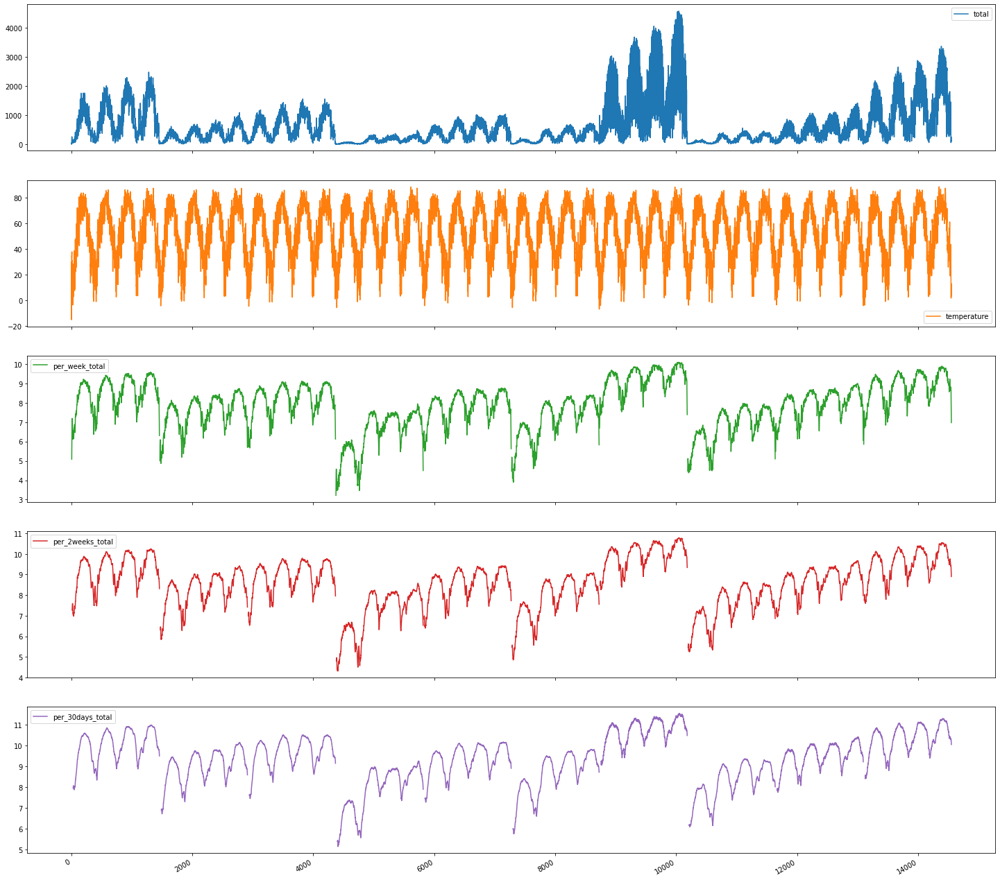

In [9]:
#k=pd.read_csv('data_10areas_new.csv')
data1.plot(subplots=True,figsize=(25,25))

<AxesSubplot:>

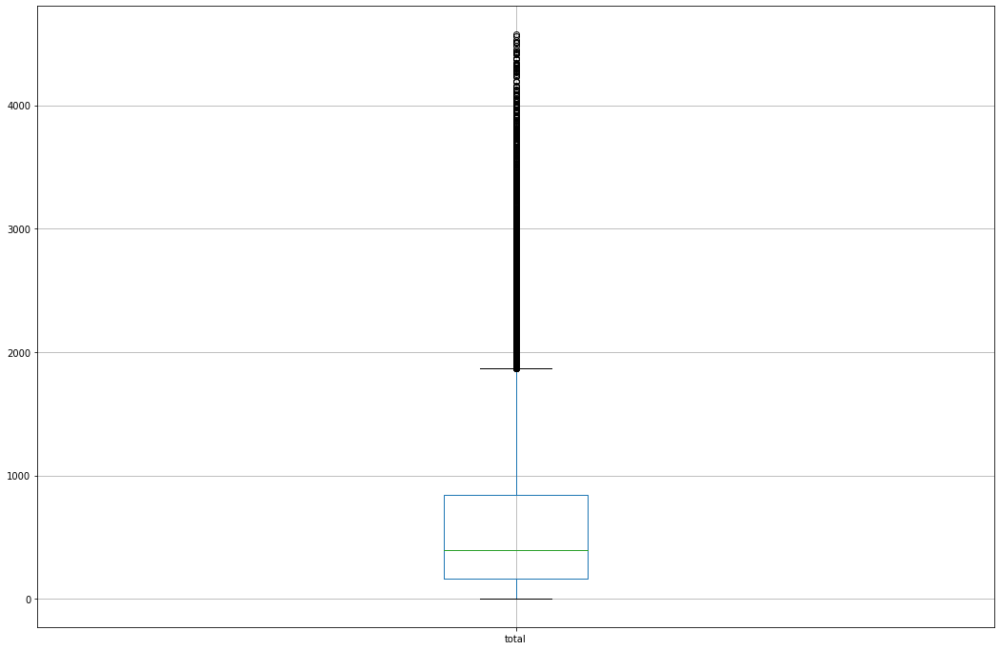

In [7]:
data1.boxplot(column='total',figsize=(18,12))
#data_test.boxplot(column='total',figsize=(18,12))

In [7]:
data_train.loc[data1['total']>3000]

,total,starttime,area_type,events,temperature,per_week_total,per_2weeks_total,per_30days_total,year,month_dayth,festival,isweekend,dayth,month,per_week_total_mean,per_2weeks_total_mean,per_30days_total_mean
896,3177,2016-06-18,0.0,cloudy,81.747372,9.780359,10.441734,11.136485,2016,06-18,summer,1,18,6,2526.142857,2447.142857,2287.666667
903,3082,2016-06-25,0.0,cloudy,83.708112,9.796348,10.481532,11.179800,2016,06-25,summer,1,25,6,2566.857143,2546.500000,2388.933333
917,3116,2016-07-09,0.0,cloudy,74.825385,9.642577,10.427683,11.209439,2016,07-09,summer,1,9,7,2201.000000,2413.000000,2460.800000
924,3126,2016-07-16,0.0,cloudy,72.606078,9.785605,10.409793,11.217816,2016,07-16,summer,1,16,7,2539.428571,2370.214286,2481.500000
1553,3150,2014-04-09,1.0,cloudy,55.495302,9.333266,9.981097,10.670001,2014,04-09,spring,0,9,4,1615.428571,1543.857143,1434.833333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2519,4027,2016-12-01,1.0,cloudy,38.260467,9.645041,10.525837,11.636646,2016,12-01,winter,0,1,12,2206.428571,2661.857143,3772.333333
2520,3832,2016-12-02,1.0,cloudy,37.326879,9.853509,10.474326,11.611005,2016,12-02,winter,0,2,12,2717.857143,2528.214286,3676.833333
2523,3148,2016-12-05,1.0,cloudy,32.065184,9.969556,10.457286,11.507873,2016,12-05,winter,0,5,12,3052.285714,2485.500000,3316.533333
2524,3785,2016-12-06,1.0,cloudy,32.087318,9.995200,10.434292,11.511034,2016,12-06,winter,0,6,12,3131.571429,2429.000000,3327.033333


In [25]:
data1['per_week_total_mean'] = data['per_week_total'].apply(lambda x :x/7)
data1['per_2weeks_total_mean'] = data['per_2weeks_total'].apply(lambda x :x/14)
data1['per_30days_total_mean'] = data['per_30days_total'].apply(lambda x : x/30)

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>], dtype=object)

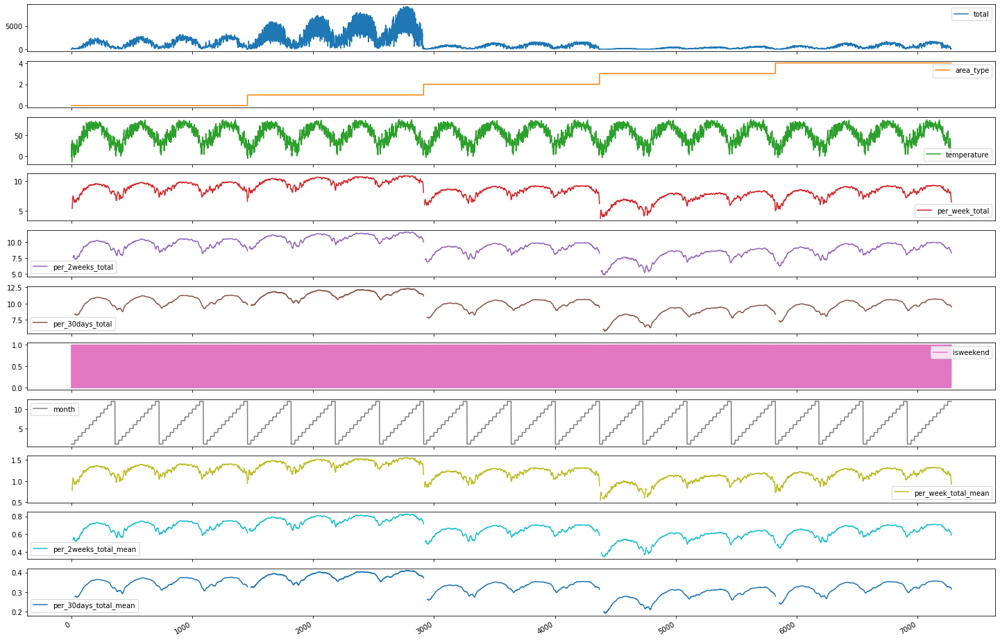

In [24]:
data1.plot(figsize=(25,18),subplots=True)
#data1.boxplot(return_type='dict',figsize=(25,18),column='temperature')

In [12]:
data1.corr()

,total,temperature,per_week_total,per_2weeks_total,per_30days_total,isweekend,month,per_week_total_mean,per_2weeks_total_mean,per_30days_total_mean
total,1.000000,0.376422,0.730040,0.730225,0.727839,-0.151669,0.143928,0.759092,0.758082,0.750748
temperature,0.376422,1.000000,0.493426,0.469201,0.420835,0.046838,0.259742,0.443901,0.417164,0.370375
per_week_total,0.730040,0.493426,1.000000,0.993264,0.980172,-0.002266,0.265531,1.000000,0.992226,0.977573
per_2weeks_total,0.730225,0.469201,0.993264,1.000000,0.991737,-0.000062,0.287980,0.992226,1.000000,0.990648
per_30days_total,0.727839,0.420835,0.980172,0.991737,1.000000,0.000539,0.318086,0.977573,0.990648,1.000000
isweekend,-0.151669,0.046838,-0.002266,-0.000062,0.000539,1.000000,-0.002428,0.021723,0.022991,0.023964
month,0.143928,0.259742,0.265531,0.287980,0.318086,-0.002428,1.000000,0.231408,0.256980,0.298006
per_week_total_mean,0.759092,0.443901,1.000000,0.992226,0.977573,0.021723,0.231408,1.000000,0.992226,0.977573
per_2weeks_total_mean,0.758082,0.417164,0.992226,1.000000,0.990648,0.022991,0.256980,0.992226,1.000000,0.990648
per_30days_total_mean,0.750748,0.370375,0.977573,0.990648,1.000000,0.023964,0.298006,0.977573,0.990648,1.000000


<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

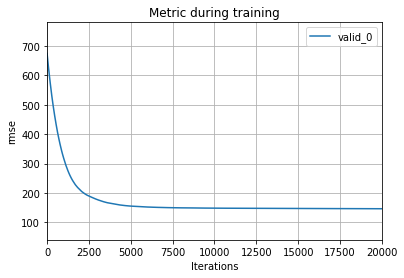

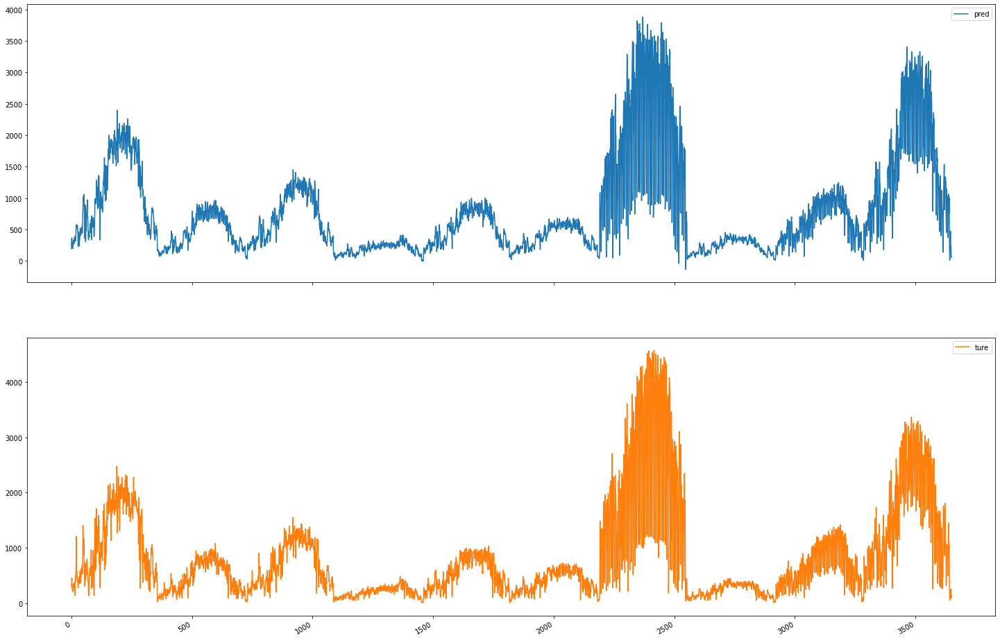

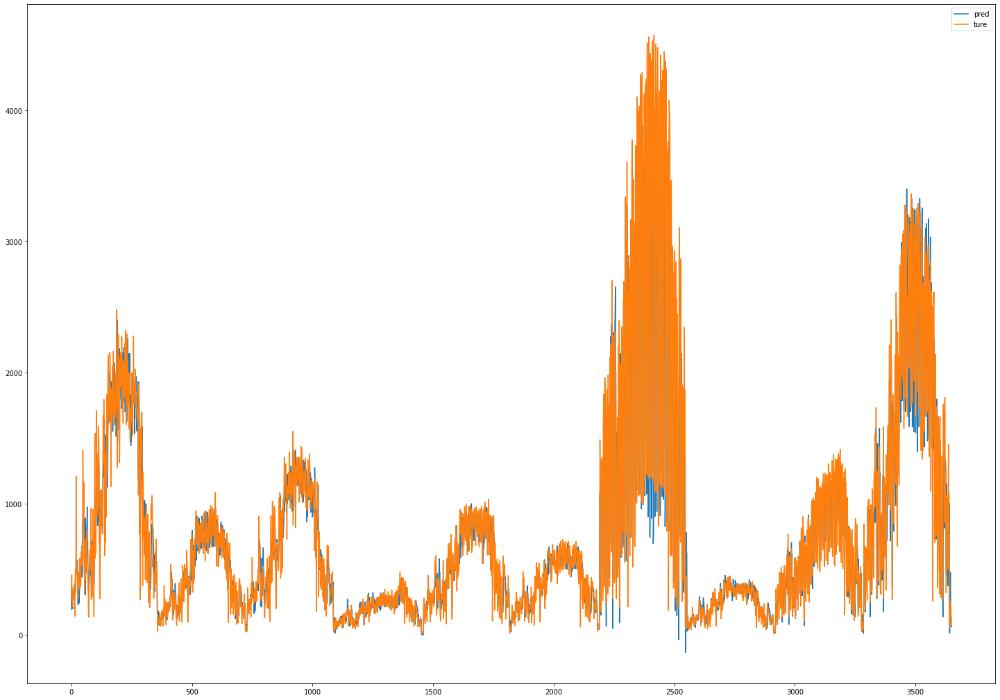

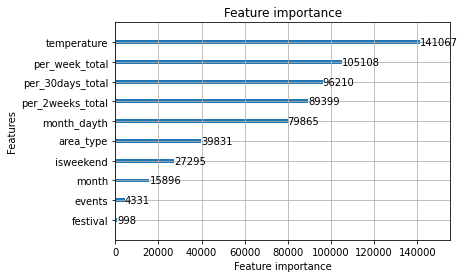

In [11]:
lgb.plot_metric(evals_result,metric='rmse')
y = np.hstack((Y_pred.reshape(-1,1),Y_test.values.reshape(-1,1)))

df = pd.DataFrame(y,columns=['pred','ture'])
df.plot(subplots=True,figsize=(25,18))
df.plot(figsize=(25,18))
lgb.plot_importance(gbm)

In [7]:
data1['dayth'] = data1['month_dayth'].apply(lambda x: x.split('-')[1]).astype('int64')
data1['month'] = data1['month_dayth'].apply(lambda x: x.split('-')[0]).astype('int64')

In [9]:
data1.to_csv('C:/python/data_5_area.csv')

In [9]:
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import r2_score
#data1 = pd.read_csv('C:/python/data_1.csv')
#data1.drop(['Unnamed: 0'],axis=1,inplace=True)
data1 = pd.read_csv('C:/python/data_5_area.csv')
data1.drop(['Unnamed: 0'],axis=1,inplace=True)

data1[['total','per_week_total','per_2weeks_total','per_30days_total']]=\
    data1[['total','per_week_total','per_2weeks_total','per_30days_total']].astype('int64')

#data1['per_week_total_mean'] = data1['per_week_total'].apply(lambda x :x/7)
#data1['per_2weeks_total_mean'] = data1['per_2weeks_total'].apply(lambda x :x/14)
#data1['per_30days_total_mean'] = data1['per_30days_total'].apply(lambda x : x/30)

data1[['events','year','month_dayth','festival','dayth','area_type','month','isweekend']] =\
     data1[['events','year','month_dayth','festival','dayth','area_type','month','isweekend']].astype('category')
#data1['temperature'] = data1['temperature'].astype('float64')
#,'month','isweekend','area_type'

data1[['per_week_total','per_2weeks_total','per_30days_total']] = data1[['per_week_total','per_2weeks_total','per_30days_total']].apply(np.log)

#
#data=data1.loc[data1['total']>40]
#data1 = data1.loc[data1['area_type'].isin([1])]
#data= data.loc[ data1['area_type'].isin([0,1,2,3,4,6,8,9])]
data1=data1.loc[(data1['total']>30)&(data1['total']<5000)]
data_test = data1.loc[(data1['year'].astype('int64').isin([2017]))]
data_train = data1.loc[(data1['year'].astype('int64').isin([2014,2015,2016]))]



#5,7,3>30,<1000
#8,4,1>100,<1000
#0,2>200,<3500
#6,9>300,<3500
#data_train1_ = data_train_1.loc[data_train_1['area_type'].isin([5,7,3])]
#data_train1 = data_train1_.loc[(data_train1_['total']>20)&(data_train1_['total']<1000)]

#data_train2_ = data_train_1.loc[data_train_1['area_type'].isin([8,4,1])]
#data_train2 = data_train2_.loc[(data_train2_['total']>50)&(data_train2_['total']<1100)]

#data_train3_ = data_train_1.loc[data_train_1['area_type'].isin([0,2,6,9])]
#data_train3 = data_train3_.loc[(data_train3_['total']>200)&(data_train1_['total']<3500)]


#data_train = pd.concat((data_train1,data_train2,data_train3))















#data_train=data_train.loc[(data_train['total']>20)]
#data_test = data1.loc[(data1['year'].astype('int64').isin([2017]))&(data1['month'].astype('int64')>6)]
#data_temp = data1.loc[(data1['year'].astype('int64').isin([2017]))&(data1['month'].astype('int64')<=6)]
#data_train = pd.concat([data_train,data_temp])


X_train,X_test,y_train,y_test =train_test_split(data_train.drop(['total','starttime','year','dayth',\
  ],axis=1),data_train['total'],test_size=0.2)

evals_result={}

lgb_train = lgb.Dataset(X_train, y_train) # 将数据保存到LightGBM二进制文件将使加载更快
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)  # 创建验证数据

params = {
    #'max_depth': 6,
    
    'task': 'train',
    'boosting_type': 'gbdt',  # 设置提升类型
    'objective': 'regression', # 目标函数
    'metric': ('l2_root', 'l1'),  # 评估函数
    'num_leaves': 31,   # 叶子节点数
    'learning_rate': 0.001,  # 学习速率
    'feature_fraction': 0.8, # 建树的特征选择比例
    'bagging_fraction': 0.8, # 建树的样本采样比例
    'bagging_freq': 5,  # k 意味着每 k 次迭代执行bagging
    'verbose': 1, # <0 显示致命的, =0 显示错误 (警告), >0 显示信息
     #'min_data_in_leaf':25,
    #'min_sum_hessian_in_leaf':1e-3,
    #'lambda_l1':0.5,
    #'lambda_l2':0.9,
    #'min_split_gain':0
}
print('Start training...')
# 训练 cv and train
gbm = lgb.train(params,lgb_train,num_boost_round=10000,valid_sets=lgb_eval,evals_result=evals_result) # 训练数据需要参数列表和数据集
print('Start predicting...')
# 预测数据集
Y_pred = gbm.predict(data_test.drop(['total','starttime','year','dayth',\
    ],axis=1), num_iteration=gbm.best_iteration) #如果在训练期间启用了早期停止，可以通过best_iteration方式从最佳迭代中获得预测
# 评估模型
Y_test=data_test['total']
y_pred = gbm.predict(X_test, num_iteration=gbm.best_iteration)
def mape_cal(observe,predict_,shape):

    mape_=(abs(observe-predict_)/observe).sum()*100/shape
    return mape_
mape_test=mape_cal(Y_test,Y_pred,Y_pred.shape[0])
mape_train = mape_cal(y_test,y_pred,y_test.shape[0])


print('training information is as follow:')
print('The rmse of prediction is:', mean_squared_error(y_test, y_pred) ** 0.5) # 计算真实值和预测值之间的均方根误差
print('The mae of prediction is:', mean_absolute_error(y_test, y_pred) )
print('The r2_score of prediction is:', r2_score(y_test, y_pred) )
print('The mape of prediction is: '+str(mape_train)+'%')

print('\n')
print('peedicting information of test is as follow:')
print('The rmse of prediction is:', mean_squared_error(Y_test, Y_pred) ** 0.5) # 计算真实值和预测值之间的均方根误差
print('The mae of prediction is:', mean_absolute_error(Y_test, Y_pred) )
print('The r2_score of prediction is:', r2_score(Y_test, Y_pred) )
print('The mape of prediction is: '+str(mape_test)+'%')

s rmse: 275.324	valid_0's l1: 150.072
[9632]	valid_0's rmse: 275.324	valid_0's l1: 150.07
[9633]	valid_0's rmse: 275.326	valid_0's l1: 150.067
[9634]	valid_0's rmse: 275.325	valid_0's l1: 150.068
[9635]	valid_0's rmse: 275.324	valid_0's l1: 150.067
[9636]	valid_0's rmse: 275.325	valid_0's l1: 150.067
[9637]	valid_0's rmse: 275.325	valid_0's l1: 150.066
[9638]	valid_0's rmse: 275.325	valid_0's l1: 150.064
[9639]	valid_0's rmse: 275.327	valid_0's l1: 150.065
[9640]	valid_0's rmse: 275.325	valid_0's l1: 150.064
[9641]	valid_0's rmse: 275.322	valid_0's l1: 150.062
[9642]	valid_0's rmse: 275.321	valid_0's l1: 150.061
[9643]	valid_0's rmse: 275.317	valid_0's l1: 150.058
[9644]	valid_0's rmse: 275.313	valid_0's l1: 150.055
[9645]	valid_0's rmse: 275.309	valid_0's l1: 150.053
[9646]	valid_0's rmse: 275.306	valid_0's l1: 150.051
[9647]	valid_0's rmse: 275.307	valid_0's l1: 150.052
[9648]	valid_0's rmse: 275.305	valid_0's l1: 150.051
[9649]	valid_0's rmse: 275.302	valid_0's l1: 150.049
[9650]	va

In [43]:
data_train.loc[data_train['total']>0]['area_type'].value_counts()

0.0    1093
9.0    1092
6.0    1092
8.0    1091
2.0    1091
7.0    1090
4.0    1090
1.0    1090
5.0    1089
3.0    1085
Name: area_type, dtype: int64

In [53]:
data_train.loc[data_train['total']<3500]['area_type'].value_counts()
#5,7,3>3,<1000
#8,4,1>100,<1000
#0,2>200,<3500
#6,9>300,<3500

0.0    1093
9.0    1092
8.0    1091
2.0    1091
7.0    1090
4.0    1090
1.0    1090
5.0    1089
3.0    1085
6.0    1019
Name: area_type, dtype: int64